In [43]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [20]:
from os import listdir
paths = listdir('imgs/')
paths

['WhatsApp Image 2017-11-04 at 14.07.04.jpeg',
 'WhatsApp Image 2017-11-04 at 14.07.06.jpeg',
 'WhatsApp Image 2017-11-04 at 14.07.08.jpeg',
 'WhatsApp Image 2017-11-04 at 14.07.03.jpeg',
 'B1.jpg',
 '20171102_120815.jpg',
 'WhatsApp Image 2017-11-04 at 14.07.02.jpeg',
 'WhatsApp Image 2017-11-04 at 14.07.10.jpeg',
 '20171102_120822.jpg']

In [22]:
for i in range(len(paths)):
    paths[i] = 'imgs/' + paths[i]
paths

['imgs/WhatsApp Image 2017-11-04 at 14.07.04.jpeg',
 'imgs/WhatsApp Image 2017-11-04 at 14.07.06.jpeg',
 'imgs/WhatsApp Image 2017-11-04 at 14.07.08.jpeg',
 'imgs/WhatsApp Image 2017-11-04 at 14.07.03.jpeg',
 'imgs/B1.jpg',
 'imgs/20171102_120815.jpg',
 'imgs/WhatsApp Image 2017-11-04 at 14.07.02.jpeg',
 'imgs/WhatsApp Image 2017-11-04 at 14.07.10.jpeg',
 'imgs/20171102_120822.jpg']

In [23]:
imgs = []
for single in paths:
    imgs.append(plt.imread(single))

In [28]:
for i in range(len(imgs)):
    imgs[i] = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2HSV)
    imgs[i] = imgs[i][:,:,1]

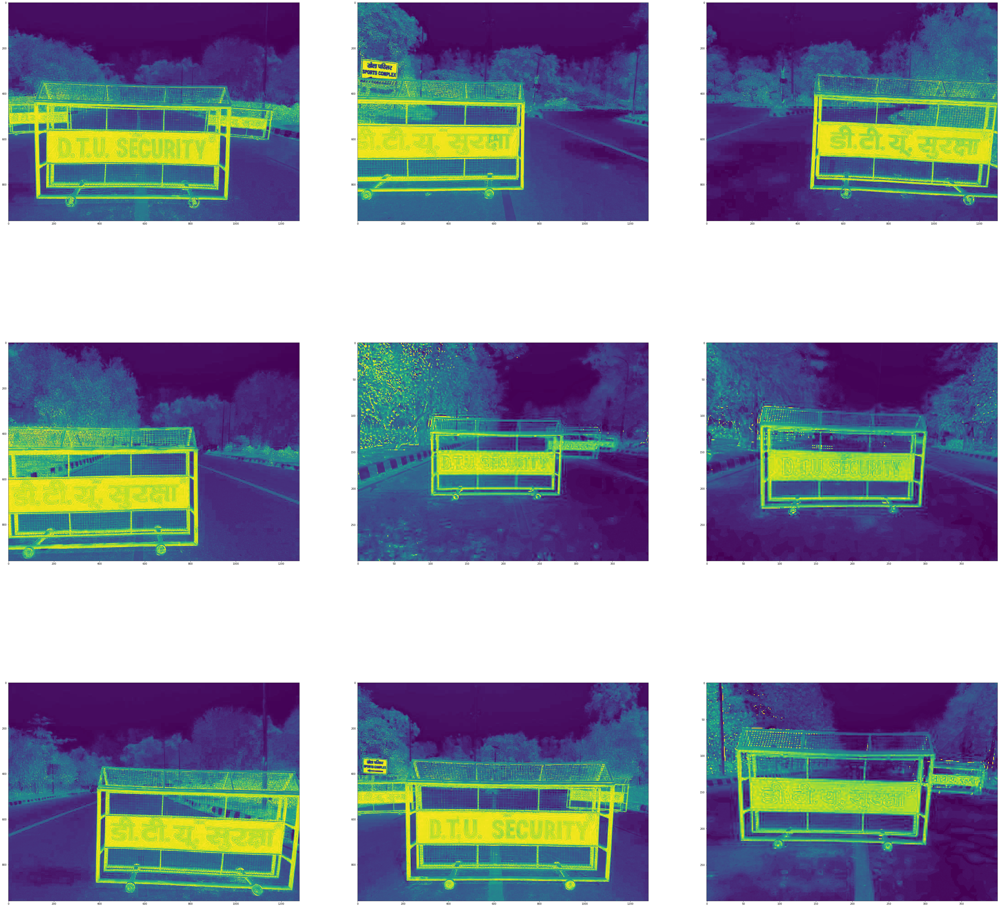

In [30]:
fig = plt.figure(figsize = (70,70))
for i in range(len(imgs)):
    sub = fig.add_subplot(3, 3, i + 1)
    sub.imshow(imgs[i], interpolation='nearest')

/home/rohan/anaconda2/envs/major/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6087: UserWarning: 2D hist input should be nsamples x nvariables;
 this looks transposed (shape is 960 x 1280)
  '(shape is %d x %d)' % inp.shape[::-1])


([array([  10.,   68.,  202.,  128.,   36.,   29.,   46.,   50.,   75.,  316.]),
  array([   7.,   69.,  210.,  122.,   35.,   29.,   49.,   71.,   65.,  303.]),
  array([  10.,   66.,  203.,  125.,   40.,   22.,   50.,   60.,   64.,  320.]),
  array([   9.,   87.,  203.,  106.,   33.,   26.,   55.,   63.,   64.,  314.]),
  array([   8.,   84.,  207.,  110.,   29.,   32.,   56.,   62.,   60.,  312.]),
  array([   8.,  101.,  186.,  117.,   37.,   28.,   56.,   72.,   47.,  308.]),
  array([  10.,  102.,  190.,  104.,   47.,   39.,   58.,   54.,   42.,  314.]),
  array([   6.,   99.,  193.,  108.,   45.,   43.,   66.,   57.,   35.,  308.]),
  array([   9.,  115.,  179.,   99.,   51.,   47.,   64.,   52.,   44.,  300.]),
  array([  11.,  102.,  200.,   81.,   58.,   58.,   72.,   45.,   51.,  282.]),
  array([   9.,   99.,  198.,   88.,   59.,   51.,   80.,   60.,   56.,  260.]),
  array([   7.,   95.,  206.,   79.,   53.,   70.,   85.,   73.,   50.,  242.]),
  array([   6.,   94.,  205.

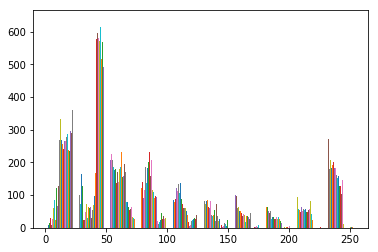

In [36]:
plt.hist(imgs[3])

In [83]:
blur = cv2.GaussianBlur(imgs[8], (5,5), 0)

In [84]:
retval, threshold = cv2.threshold(blur, 200, 250, cv2.THRESH_BINARY)

In [85]:
kernel = np.ones((7,7), np.uint8)
erosion = cv2.erode(threshold, kernel, iterations = 1)

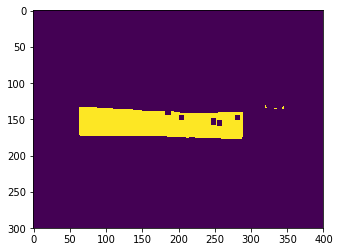

In [86]:
plt.imshow(erosion)

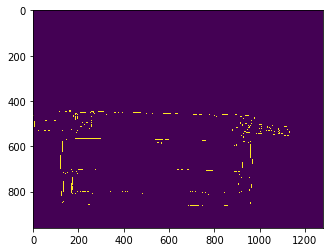

In [58]:
canny = cv2.Canny(erosion, 0, 100)
plt.imshow(canny)

In [52]:
rho = 2
theta = (np.pi/180) * 1
threshold = 20
minlinelen = 20
maxlinegap = 5
hough = cv2.HoughLinesP(erosion, rho, theta, threshold, np.array([]), minLineLength = minlinelen, maxLineGap = maxlinegap)